In [2]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

fhvhv_2020_df = pd.read_feather('/Volumes/E/data/preprocessed_data/fhvhv_2020.feather')
fhvhv_covid_df = pd.read_csv('/Volumes/E/data/preprocessed_data/fhvhv_covid.csv')
fhvhv_covid_df.head()

,pickup_date,num_of_SR,trip_count,avg_trip_duration,CASE_COUNT,PROBABLE_CASE_COUNT,CASE_COUNT_7DAY_AVG,ALL_CASE_COUNT_7DAY_AVG,BX_CASE_COUNT,BX_PROBABLE_CASE_COUNT,...,MN_CASE_COUNT_7DAY_AVG,MN_ALL_CASE_COUNT_7DAY_AVG,QN_CASE_COUNT,QN_PROBABLE_CASE_COUNT,QN_CASE_COUNT_7DAY_AVG,QN_ALL_CASE_COUNT_7DAY_AVG,SI_CASE_COUNT,SI_PROBABLE_CASE_COUNT,SI_CASE_COUNT_7DAY_AVG,SI_ALL_CASE_COUNT_7DAY_AVG
0,2020-09-01,34,344879,17.833136,294,34,255,278,52,9,...,45,48,73,4,58,62,24,1,18,19
1,2020-09-02,42,357969,17.718040,271,25,249,272,42,6,...,45,48,69,3,58,62,17,0,18,19
2,2020-09-03,26,391021,18.258425,274,29,250,274,41,5,...,43,46,90,11,62,67,17,4,19,20
3,2020-09-04,6,425570,19.115868,230,19,243,267,44,1,...,40,43,59,4,63,68,26,2,20,21
4,2020-09-05,0,434656,17.152276,156,11,247,269,30,3,...,40,43,34,3,63,68,24,0,22,23


# Pick-ups time analysis

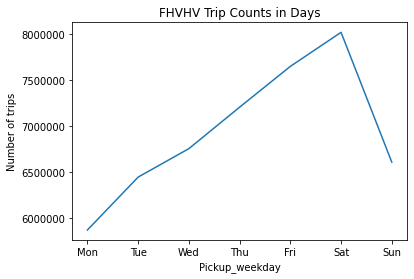

In [5]:
weekday_trip = fhvhv_2020_df.groupby(['pickup_weekday'])['pickup_weekday'].agg(['count'])
weekday_trip = weekday_trip.reset_index()
weekday_trip['pickup_weekday'].replace({0: "Mon", 1: "Tue", 2:"Wed",3:"Thu",4:"Fri",5:"Sat",6:"Sun"}, inplace=True)

plt.ticklabel_format(style='plain', axis='y')
plt.plot(weekday_trip['pickup_weekday'],weekday_trip['count'])
plt.title("FHVHV Trip Counts in Days")
plt.ylabel('Number of trips')
plt.xlabel('Pickup_weekday')
plt.savefig('/Volumes/E/data/plots/Trip_Counts_in_Days.png')
plt.show()


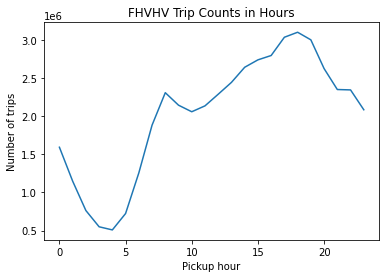

In [6]:
hour_trip = fhvhv_2020_df.groupby(['pickup_hour'])['pickup_hour'].agg(['count'])
hour_trip = hour_trip.reset_index()

plt.plot(hour_trip['pickup_hour'],hour_trip['count'])
plt.title("FHVHV Trip Counts in Hours")
plt.ylabel('Number of trips')
plt.xlabel('Pickup hour')
plt.savefig('/Volumes/E/data/plots/Trip_Counts_in_Hours.png')
plt.show()

# Investigating correlations

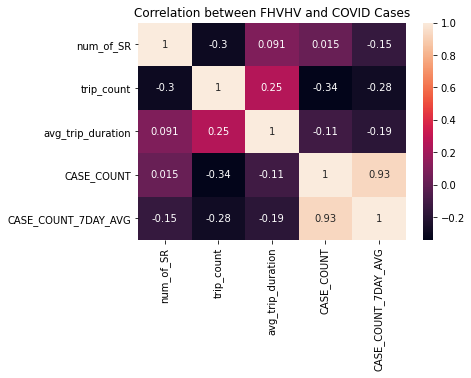

In [2]:
# A correlation heatmap to explore some areas of interest

import seaborn as sns
import matplotlib.pyplot as plt

CORR_COLS = ['num_of_SR','trip_count','avg_trip_duration','CASE_COUNT','CASE_COUNT_7DAY_AVG']
sns.heatmap(fhvhv_covid_df[CORR_COLS].corr(),annot=True)
plt.title('Correlation between FHVHV and COVID Cases')
plt.savefig('/Volumes/E/data/plots/correlation_heatmap.png')
plt.show()

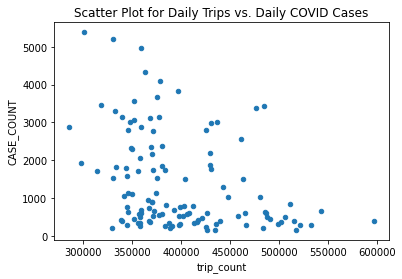

In [33]:
# To visualise the linear relationship between number of trips and the number of covid cases

fhvhv_covid_df[['trip_count', 'CASE_COUNT']].plot.scatter(x='trip_count', y='CASE_COUNT')
plt.title('Scatter Plot for Daily Trips vs. Daily COVID Cases')
plt.savefig('/Volumes/E/data/plots/scatter_plot.png')
plt.show()

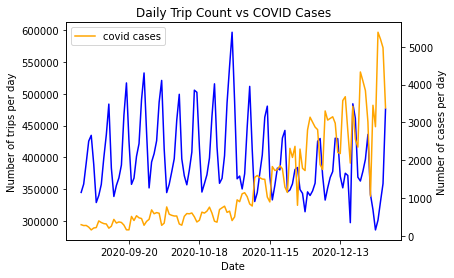

In [5]:
import matplotlib.dates as mdates

fig, ax_left = plt.subplots()

ax_left.set_xlabel('Date')
ax_left.set_ylabel('Number of trips per day')
ax_left.plot(fhvhv_covid_df['pickup_date'],fhvhv_covid_df['trip_count'], color='blue',label='trips')
ax_left.xaxis.set_major_locator(mdates.WeekdayLocator(interval=4))

ax_right = ax_left.twinx()
ax_right.set_ylabel('Number of cases per day')
ax_right.plot(fhvhv_covid_df['CASE_COUNT'], color='orange',label='covid cases')


plt.title("Daily Trip Count vs COVID Cases")
plt.legend()
plt.savefig('/Volumes/E/data/plots/trip_count_vs_cases.png')
plt.show()


# Examining distribution 

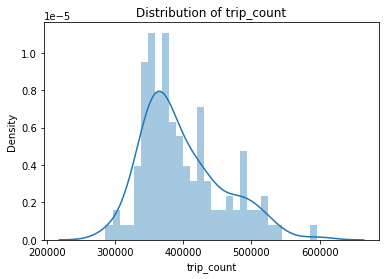

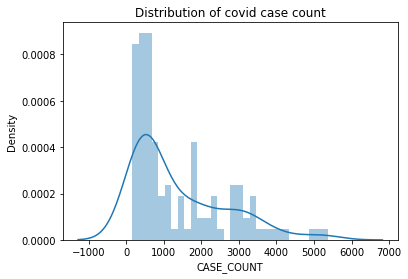

In [40]:
sns.distplot(fhvhv_covid_df['trip_count'], bins=30)
plt.title('Distribution of trip_count')
plt.savefig('/Volumes/E/data/plots/trip_count_vs_cases.png')
plt.show()

sns.distplot(fhvhv_covid_df['CASE_COUNT'], bins=30)
plt.title('Distribution of covid case count')
plt.savefig('/Volumes/E/data/plots/trip_count_vs_cases.png')
plt.show()

# Geospatial data

In [3]:
# Codes are based on lab2's materials
# and https://geopandas.org/gallery/polygon_plotting_with_folium.html

import geopandas as gpd
import folium
from folium.plugins import FastMarkerCluster

# sf stands for shape file
sf = gpd.read_file("/Volumes/E/data/taxi_zones/taxi_zones.shp")
zone = pd.read_csv("/Volumes/E/data/taxi_zones/taxi+_zone_lookup.csv")

# Convert the geometry shape to to latitude and longitude
# Please attribute this if you are using it
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")


In [4]:
# Pick up
PUgdf = gpd.GeoDataFrame(pd.merge(fhvhv_2020_df, sf, left_on='PULocationID', 
                                right_on='LocationID')).drop('PULocationID',axis=1)
PUgeoJSON = PUgdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()

PUgdf_sample = PUgdf.sample(120)
PUgdf_sample['PU_lat'] = PUgdf_sample.centroid.y
PUgdf_sample['PU_lon'] = PUgdf_sample.centroid.x


PUmap = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on how to plot aggregated data.
PUmap.add_child(folium.Choropleth(geo_data=PUgeoJSON, 
                              name='choropleth', 
                              fill_opacity=0.2,
                              line_opacity=0.5,
                              legend_name='Pickup Map'))

for i, row in PUgdf_sample.iterrows():
    folium.Marker(location = [row['PU_lat'], row['PU_lon']]).add_to(PUmap)

PUmap.save('/Volumes/E/MAST30034_Python/plots/hvfhsPickupMap.html')
PUmap

In [5]:
# Map for drop-off location

DOgdf = gpd.GeoDataFrame(pd.merge(fhvhv_2020_df, sf, left_on='DOLocationID', 
                                right_on='LocationID')).drop('DOLocationID',axis=1)
DOgeoJSON = DOgdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()

DOgdf_sample = PUgdf.sample(120)
DOgdf_sample['DO_lat'] = DOgdf_sample.centroid.y
DOgdf_sample['DO_lon'] = DOgdf_sample.centroid.x

DOmap = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on how to plot aggregated data.
DOmap.add_child(folium.Choropleth(geo_data=DOgeoJSON, 
                              name='choropleth', 
                              fill_opacity=0.2,
                              line_opacity=0.5,
                              legend_name='Dropoff Map'))

for i, row in DOgdf_sample.iterrows():
    folium.Marker(location = [row['DO_lat'], row['DO_lon']]).add_to(DOmap)

DOmap.save('/Volumes/E/MAST30034_Python/plots/hvfhsDropoffMap.html')
DOmap